In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.arima_model import ARIMA, ARMA, AR
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.stattools import adfuller  

from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import pmdarima as pm
from pmdarima.arima import auto_arima
!matplotlib inline

import plotly
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.io as pio

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

/bin/sh: matplotlib: command not found


In [4]:
air_res = pd.read_csv('../data/air_reserve.csv')
air_info = pd.read_csv('../data/air_store_info.csv')
air_visit = pd.read_csv('../data/air_visit_data.csv')
hpg_res = pd.read_csv('../data/hpg_reserve.csv')
hpg_info = pd.read_csv('../data/hpg_store_info.csv')

store_id = pd.read_csv('../data/store_id_relation.csv')
date_info=pd.read_csv('../data/date_info.csv')



In [38]:
air_visit.head()

,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32
2,air_ba937bf13d40fb24,2016-01-15,29
3,air_ba937bf13d40fb24,2016-01-16,22
4,air_ba937bf13d40fb24,2016-01-18,6


In [39]:
air_visit['visit_date']= pd.to_datetime(air_visit['visit_date'])

In [40]:

air_visit['year'] = air_visit['visit_date'].dt.year
air_visit['month'] = air_visit['visit_date'].dt.month
air_visit['day'] = air_visit['visit_date'].dt.dayofyear
air_visit['weekday'] = air_visit['visit_date'].dt.weekday_name #dayofweek

In [41]:
air_visit.set_index('visit_date', inplace=True)
#air_visit.index = pd.to_datetime(air_visit.index)

In [42]:
air_info.head()

,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [43]:
air_visit.tail()

,air_store_id,visitors,year,month,day,weekday
visit_date,,,,,,
2017-04-18,air_24e8414b9b07decb,6,2017,4,108,Tuesday
2017-04-19,air_24e8414b9b07decb,6,2017,4,109,Wednesday
2017-04-20,air_24e8414b9b07decb,7,2017,4,110,Thursday
2017-04-21,air_24e8414b9b07decb,8,2017,4,111,Friday
2017-04-22,air_24e8414b9b07decb,5,2017,4,112,Saturday


In [44]:
total_visitors= air_visit.groupby(by='visit_date').sum()

In [45]:
total_visitors.head()

,visitors,year,month,day
visit_date,,,,
2016-01-01,1033,96768,48,48
2016-01-02,1764,127008,63,126
2016-01-03,2368,163296,81,243
2016-01-04,3326,316512,157,628
2016-01-05,3927,465696,231,1155


Text(0.5, 1.0, 'Number of Visitors in AirRegi system overtime')

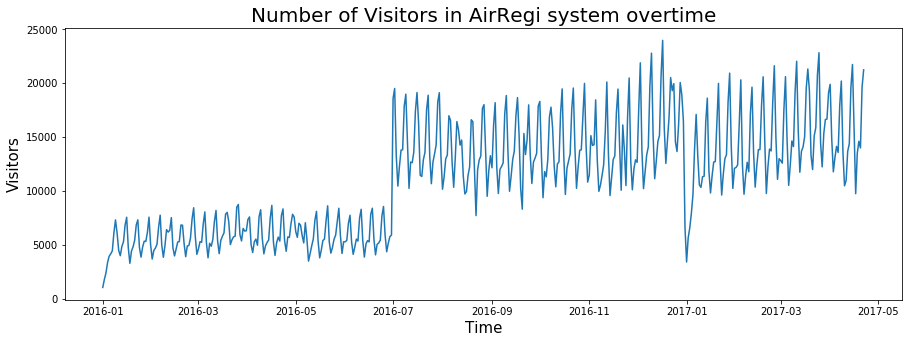

In [46]:
plt.figure(figsize=(15,5))
plt.plot(total_visitors['visitors'])
plt.ylabel('Visitors', fontsize=15)
plt.xlabel('Time', fontsize=15)
plt.title('Number of Visitors in AirRegi system overtime', fontsize=20)

Text(0.5, 1.0, 'Auto Correlation Visitors ')

<Figure size 1080x360 with 0 Axes>

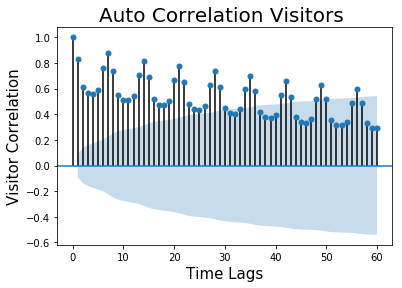

In [47]:
plt.figure(figsize=(15,5))
plot_acf(total_visitors['visitors'], lags=60)
plt.ylabel('Visitor Correlation', fontsize=15)
plt.xlabel('Time Lags', fontsize=15)
plt.title('Auto Correlation Visitors ', fontsize=20)

In [48]:
monthly_visit = air_visit.resample('M')
weekly_visit = air_visit.resample('W')

In [49]:
monthly_visit= air_visit.resample('M').mean()

In [50]:
monthly_visit=pd.DataFrame(monthly_visit)

In [51]:
# monthly_visit.rename({0:'Date', 1:'Visits'}, axis=1, inplace=True)
# #monthly_visit.set_index('Date')
# monthly_visit
from pandas.api.types import CategoricalDtype
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)

In [52]:
weekly_visit = air_visit.resample('W').sum()

In [53]:
visits_week=air_visit.groupby('weekday').mean().reindex(cats)

In [54]:
visits_month=air_visit.groupby('month').mean()
visits_month.head()

,visitors,year,day
month,,,
1,19.976758,2016.729090,17.397779
2,20.477695,2016.722634,45.604705
3,22.400360,2016.729212,75.278214
4,21.816002,2016.660967,103.320843
5,22.009313,2016.000000,137.275456


In [55]:
visits_week.sort_values(by='weekday')

,visitors,year,month,day
weekday,,,,
Friday,23.072737,2016.308840,6.207355,173.829174
Monday,17.177009,2016.306452,6.206679,174.168802
Saturday,26.313688,2016.312057,6.196628,173.227828
Sunday,23.873362,2016.305692,6.189857,173.489847
Thursday,18.922702,2016.311033,6.221997,174.038399
Tuesday,17.672137,2016.303457,6.206636,174.303873
Wednesday,19.230121,2016.305208,6.225014,174.374426


<BarContainer object of 16 artists>

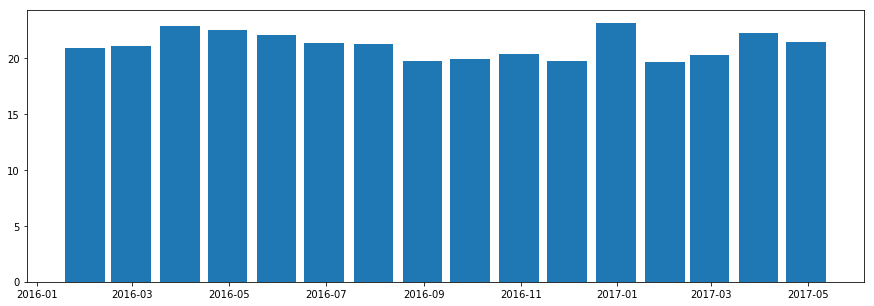

In [56]:
plt.figure(figsize=(15,5))
plt.bar (monthly_visit.index, monthly_visit['visitors'], width=25 )

Text(0.5, 1.0, 'Mean Visitors per Weekday ')

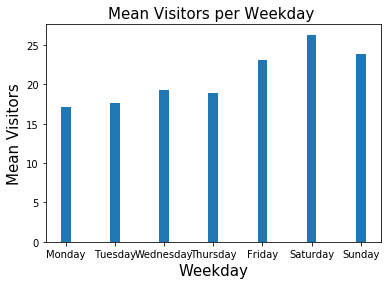

In [57]:
plt.bar(visits_week.index, visits_week['visitors'], width=0.2 )
plt.ylabel('Mean Visitors', fontsize=15)
plt.xlabel('Weekday', fontsize=15)
plt.title('Mean Visitors per Weekday ', fontsize=15)

<BarContainer object of 12 artists>

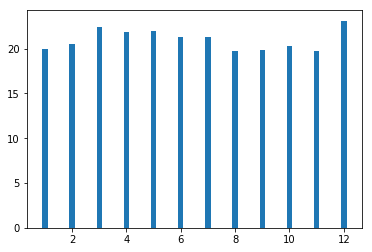

In [58]:
plt.bar(visits_month.index, visits_month['visitors'], width=0.2 )

In [59]:
import seaborn as sns

In [60]:
# sns.boxplot(data=visits_week, x=visits_week.index, y=visits_week['visitors'])

In [61]:
#air_visit.groupby('weekday').mean()

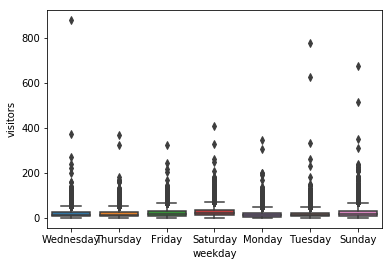

In [62]:
sns.boxplot(data=air_visit, x='weekday', y='visitors')

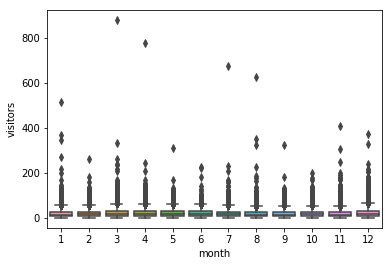

In [63]:
sns.boxplot(data=air_visit, x='month', y='visitors')

### Geo Spatial Modeling of Store Information

In [64]:
#!pip install folium

In [65]:
import folium

In [66]:
air_info.head(2)

,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852


In [67]:
air_map=folium.Map(location=[37,138], zoom_start=5)
for store, row in air_info.iterrows():
    folium.CircleMarker (location=[row['latitude'], row['longitude']],popup=row["air_store_id"]).add_to(air_map)
air_map

In [68]:
air_map=folium.Map(location=[37,138], zoom_start=5)
for store, row in air_info.iterrows():
    folium.Marker (location=[row['latitude'], row['longitude']],popup=row["air_genre_name"]).add_to(air_map)
air_map

In [69]:
air_info.shape

(829, 5)

In [70]:
area_name=pd.DataFrame(air_info.groupby('air_area_name').mean())
area_name.head()

,latitude,longitude
air_area_name,,
Fukuoka-ken Fukuoka-shi Daimyō,33.589146,130.392878
Fukuoka-ken Fukuoka-shi Hakata Ekimae,33.591358,130.414878
Fukuoka-ken Fukuoka-shi Imaizumi,33.585816,130.398694
Fukuoka-ken Fukuoka-shi Momochi,33.581941,130.348436
Fukuoka-ken Fukuoka-shi Shiobaru,33.561569,130.426428


In [71]:
area_name['area']=area_name.index.values

In [72]:
area_name.head()

,latitude,longitude,area
air_area_name,,,
Fukuoka-ken Fukuoka-shi Daimyō,33.589146,130.392878,Fukuoka-ken Fukuoka-shi Daimyō
Fukuoka-ken Fukuoka-shi Hakata Ekimae,33.591358,130.414878,Fukuoka-ken Fukuoka-shi Hakata Ekimae
Fukuoka-ken Fukuoka-shi Imaizumi,33.585816,130.398694,Fukuoka-ken Fukuoka-shi Imaizumi
Fukuoka-ken Fukuoka-shi Momochi,33.581941,130.348436,Fukuoka-ken Fukuoka-shi Momochi
Fukuoka-ken Fukuoka-shi Shiobaru,33.561569,130.426428,Fukuoka-ken Fukuoka-shi Shiobaru


In [73]:
air_map=folium.Map(location=[37,138], zoom_start=5)
for store, row in air_info.iterrows():
    folium.CircleMarker (location=[row['latitude'], row['longitude']],popup=row["air_store_id"]).add_to(air_map)
air_map

In [74]:
air_map1=folium.Map(location=[37,138], zoom_start=5)
for area, row in area_name.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],popup=row['area']).add_to(air_map1)
air_map1

### Merge Data Bases to further explore Relationships

In [75]:
# air_res = pd.read_csv('./air_reserve.csv')
# air_info = pd.read_csv('./air_store_info.csv')
air_visit = pd.read_csv('./air_visit_data.csv')
# hpg_res = pd.read_csv('./hpg_reserve.csv')
# hpg_info = pd.read_csv('./hpg_store_info.csv')

# store_id = pd.read_csv('./store_id_relation.csv')
# date_info=pd.read_csv('./date_info.csv')


In [76]:
data=pd.DataFrame()

In [77]:
store_id.head()

,air_store_id,hpg_store_id
0,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
1,air_a24bf50c3e90d583,hpg_c34b496d0305a809
2,air_c7f78b4f3cba33ff,hpg_cd8ae0d9bbd58ff9
3,air_947eb2cae4f3e8f2,hpg_de24ea49dc25d6b8
4,air_965b2e0cf4119003,hpg_653238a84804d8e7


In [78]:
date_info.head()

,calendar_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1
1,2016-01-02,Saturday,1
2,2016-01-03,Sunday,1
3,2016-01-04,Monday,0
4,2016-01-05,Tuesday,0


In [79]:
date_info.rename({'calendar_date':'visit_date'}, axis=1, inplace=True)

In [80]:
 date_info['visit_date'] = pd.to_datetime(date_info['visit_date'])

In [81]:
air_visit.head()

,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32
2,air_ba937bf13d40fb24,2016-01-15,29
3,air_ba937bf13d40fb24,2016-01-16,22
4,air_ba937bf13d40fb24,2016-01-18,6


In [82]:
# air_visit['visit_date']=air_visit.index.values
air_visit['visit_date']= pd.to_datetime(air_visit['visit_date'])

In [83]:
air_visit['year'] = air_visit['visit_date'].dt.year
air_visit['month'] = air_visit['visit_date'].dt.month
air_visit['day'] = air_visit['visit_date'].dt.dayofyear
air_visit['weekday'] = air_visit['visit_date'].dt.weekday_name #dayofweek

In [84]:
air_visit.head()

,air_store_id,visit_date,visitors,year,month,day,weekday
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday
1,air_ba937bf13d40fb24,2016-01-14,32,2016,1,14,Thursday
2,air_ba937bf13d40fb24,2016-01-15,29,2016,1,15,Friday
3,air_ba937bf13d40fb24,2016-01-16,22,2016,1,16,Saturday
4,air_ba937bf13d40fb24,2016-01-18,6,2016,1,18,Monday


In [85]:
air_res.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


In [86]:
air_res.rename({'visit_datetime':'visit_date'}, axis=1, inplace=True)

In [87]:
air_res.head()

,air_store_id,visit_date,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


In [88]:
air_res['visit_date']=pd.to_datetime(air_res['visit_date'])

In [89]:
air_info.head()

,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [90]:
data=pd.merge(air_visit, air_res, how='left', on=['air_store_id', 'visit_date'])

In [91]:
data.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN
1,air_ba937bf13d40fb24,2016-01-14,32,2016,1,14,Thursday,NaN,NaN
2,air_ba937bf13d40fb24,2016-01-15,29,2016,1,15,Friday,NaN,NaN
3,air_ba937bf13d40fb24,2016-01-16,22,2016,1,16,Saturday,NaN,NaN
4,air_ba937bf13d40fb24,2016-01-18,6,2016,1,18,Monday,NaN,NaN


In [92]:
air_visit.shape

(252108, 7)

In [93]:
data.shape

(252204, 9)

In [94]:
air_info.head()

,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [95]:
data=pd.merge(data, air_info, how='left', on=['air_store_id'])

In [96]:
data.shape

(252204, 13)

In [97]:
data.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors,air_genre_name,air_area_name,latitude,longitude
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
1,air_ba937bf13d40fb24,2016-01-14,32,2016,1,14,Thursday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
2,air_ba937bf13d40fb24,2016-01-15,29,2016,1,15,Friday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
3,air_ba937bf13d40fb24,2016-01-16,22,2016,1,16,Saturday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599
4,air_ba937bf13d40fb24,2016-01-18,6,2016,1,18,Monday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [98]:
data=pd.merge(data, date_info, how='inner', on=['visit_date'])  ## changed to how=left from how=inner

In [99]:
data.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0
1,air_25e9888d30b386df,2016-01-13,21,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Shinagawa-ku Higashigotanda,35.626568,139.725858,Wednesday,0
2,air_fd6aac1043520e83,2016-01-13,40,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0
3,air_64d4491ad8cdb1c6,2016-01-13,5,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0
4,air_ee3a01f0c71a769f,2016-01-13,18,2016,1,13,Wednesday,NaN,NaN,Cafe/Sweets,Shizuoka-ken Hamamatsu-shi Motoshirochō,34.710895,137.725940,Wednesday,0


In [100]:
data.shape

(252204, 15)

In [101]:
data.isnull().sum()

air_store_id             0
visit_date               0
visitors                 0
year                     0
month                    0
day                      0
weekday                  0
reserve_datetime    251806
reserve_visitors    251806
air_genre_name           0
air_area_name            0
latitude                 0
longitude                0
day_of_week              0
holiday_flg              0
dtype: int64

In [102]:
air_visit.shape

(252108, 7)

In [103]:
data.columns

Index(['air_store_id', 'visit_date', 'visitors', 'year', 'month', 'day',
       'weekday', 'reserve_datetime', 'reserve_visitors', 'air_genre_name',
       'air_area_name', 'latitude', 'longitude', 'day_of_week', 'holiday_flg'],
      dtype='object')

## BaselineScore by weekday

In [104]:
temp = data.groupby(['weekday'], as_index=False)['visitors'].mean().rename(columns={'visitors':'mean_visitors_week'})
data_basic = pd.merge(data, temp, how='left', on=['weekday'])

In [105]:
print('RMSE : ', sqrt(mean_squared_error(data_basic['visitors'], data_basic['mean_visitors_week']) ))
print( 'R^2:', r2_score(data_basic['visitors'], data_basic['mean_visitors_week']))

RMSE :  16.439918622678125
R^2: 0.03774222517508141


In [106]:
data_basic.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,mean_visitors_week
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,19.237727
1,air_25e9888d30b386df,2016-01-13,21,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Shinagawa-ku Higashigotanda,35.626568,139.725858,Wednesday,0,19.237727
2,air_fd6aac1043520e83,2016-01-13,40,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,19.237727
3,air_64d4491ad8cdb1c6,2016-01-13,5,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,19.237727
4,air_ee3a01f0c71a769f,2016-01-13,18,2016,1,13,Wednesday,NaN,NaN,Cafe/Sweets,Shizuoka-ken Hamamatsu-shi Motoshirochō,34.710895,137.725940,Wednesday,0,19.237727


In [107]:
# Code is enspired by : https://www.kaggle.com/jeru666/rrv-modelling-trials
temp = data.groupby(['air_store_id','weekday'], as_index=False)['visitors'].min().rename(columns={'visitors':'min_visitors'})
data = pd.merge(data, temp, how='left', on=['air_store_id','weekday']) 
temp = data.groupby(['air_store_id','weekday'], as_index=False)['visitors'].mean().rename(columns={'visitors':'mean_visitors'})
data = pd.merge(data, temp, how='left', on=['air_store_id','weekday'])
temp = data.groupby(['air_store_id','weekday'], as_index=False)['visitors'].median().rename(columns={'visitors':'median_visitors'})
data = pd.merge(data, temp, how='left', on=['air_store_id','weekday'])
temp = data.groupby(['air_store_id','weekday'], as_index=False)['visitors'].max().rename(columns={'visitors':'max_visitors'})
data = pd.merge(data, temp, how='left', on=['air_store_id','weekday'])
temp = data.groupby(['air_store_id','weekday'], as_index=False)['visitors'].count().rename(columns={'visitors':'count_observations'})

In [108]:
temp.head()

,air_store_id,weekday,count_observations
0,air_00a91d42b08b08d9,Friday,40
1,air_00a91d42b08b08d9,Monday,35
2,air_00a91d42b08b08d9,Saturday,38
3,air_00a91d42b08b08d9,Sunday,1
4,air_00a91d42b08b08d9,Thursday,38


In [111]:
temp.shape

(5741, 3)

In [112]:
data.shape

(252204, 19)

In [113]:
data.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,min_visitors,mean_visitors,median_visitors,max_visitors
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,7,23.843750,25.0,57
1,air_25e9888d30b386df,2016-01-13,21,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Shinagawa-ku Higashigotanda,35.626568,139.725858,Wednesday,0,1,6.921569,4.0,28
2,air_fd6aac1043520e83,2016-01-13,40,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,9,35.272727,37.5,60
3,air_64d4491ad8cdb1c6,2016-01-13,5,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,4,15.746269,15.0,55
4,air_ee3a01f0c71a769f,2016-01-13,18,2016,1,13,Wednesday,NaN,NaN,Cafe/Sweets,Shizuoka-ken Hamamatsu-shi Motoshirochō,34.710895,137.725940,Wednesday,0,4,19.278689,18.0,79


In [114]:
#data.to_csv('./dataAll.csv')

Text(0.5, 1.0, 'Mean Visitors for different Areas')

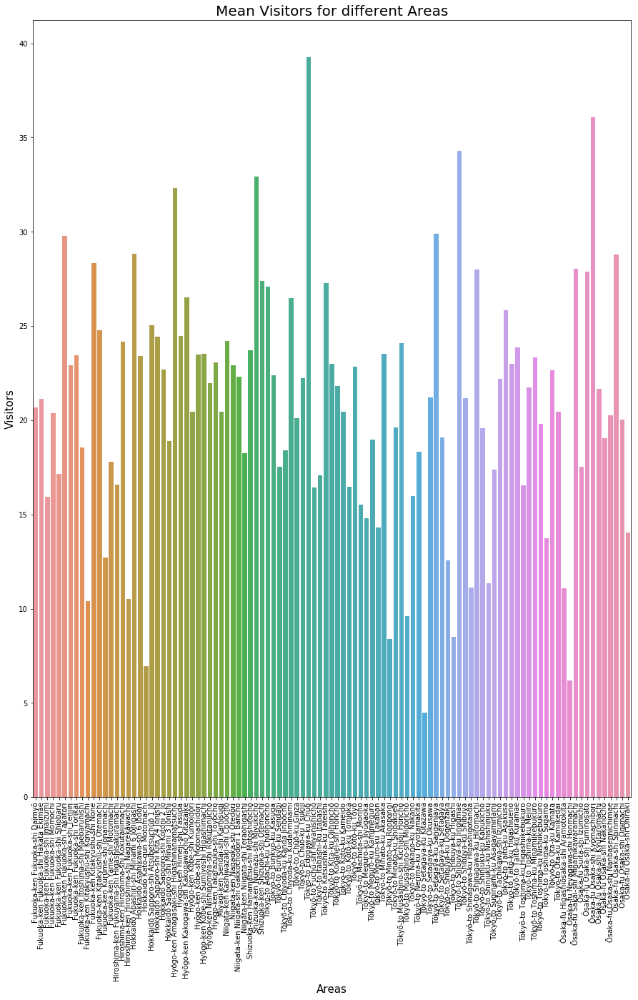

In [155]:
area_visit = data.groupby(['air_area_name'], as_index=False).mean()


plt.figure(figsize=(15,20))
sns.barplot(area_visit['air_area_name'], area_visit['visitors'])
plt.tick_params(axis='x', labelrotation=90)
plt.ylabel('Visitors', fontsize=15)
plt.xlabel('Areas', fontsize=15)
plt.title('Mean Visitors for different Areas', fontsize=20)

In [116]:
area_visit.sort_values(by='mean_visitors', ascending=False).head()

,air_area_name,visitors,year,month,day,reserve_visitors,latitude,longitude,holiday_flg,min_visitors,mean_visitors,median_visitors,max_visitors
47,Tōkyō-to Edogawa-ku Chūō,39.275728,2016.372816,6.902913,194.970874,2.0,35.706657,139.868427,0.061165,14.967961,39.275728,38.706796,70.871845
96,Ōsaka-fu Ōsaka-shi Kyōmachibori,36.071987,2016.281690,6.107981,170.896714,NaN,34.687697,135.495413,0.046948,10.298905,36.071987,35.597809,67.406886
73,Tōkyō-to Shibuya-ku Jingūmae,34.282014,2016.289209,5.910791,164.499281,NaN,35.669290,139.707056,0.064748,10.328058,34.282014,29.612950,100.074820
38,Shizuoka-ken Numazu-shi Miyukichō,32.939180,2016.237624,5.545969,153.676096,NaN,35.095584,138.863492,0.035361,12.427157,32.939180,29.942008,74.978784
24,Hyōgo-ken Amagasaki-shi Higashinanamatsuchō,32.338462,2016.377778,6.822222,192.449573,NaN,34.733734,135.406376,0.068376,11.565812,32.338462,32.090598,62.524786


Text(0.5, 1.0, 'Mean Visitors for different Restaurant Types')

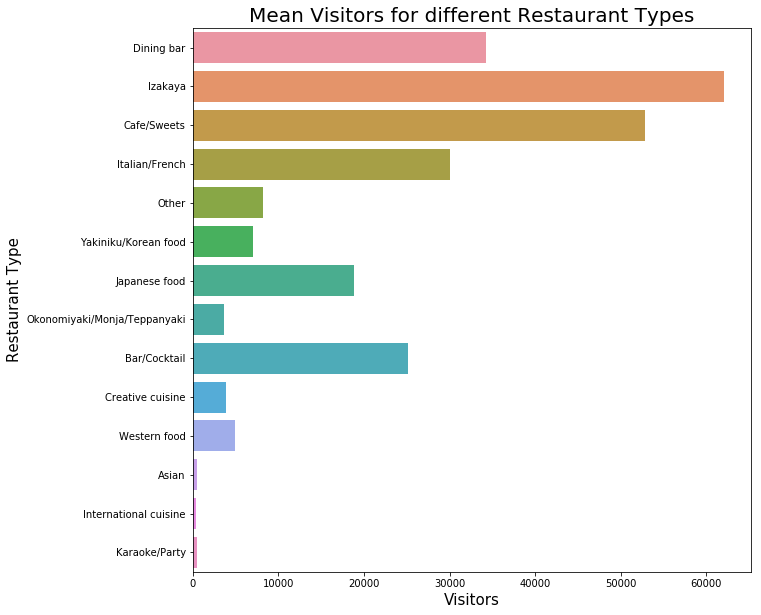

In [154]:
plt.figure(figsize=(10,10))
sns.countplot(y=data['air_genre_name'], data=data)
plt.ylabel('Restaurant Type', fontsize=15)
plt.xlabel('Visitors', fontsize=15)
plt.title('Mean Visitors for different Restaurant Types', fontsize=20)

Text(0.5, 1.0, 'Mean Visitors for different Food Genre')

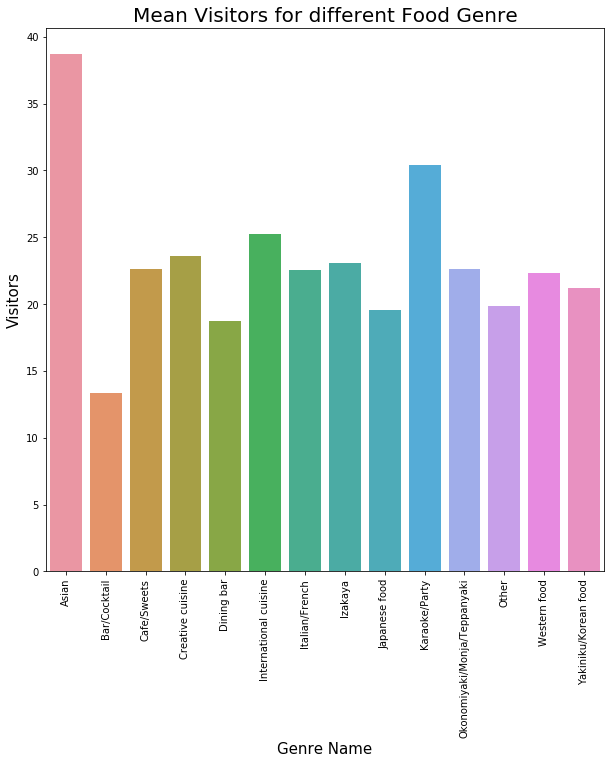

In [156]:
genre_visit = data.groupby(['air_genre_name'], as_index=False)['visitors'].mean()


plt.figure(figsize=(10,10))
sns.barplot(genre_visit['air_genre_name'], genre_visit['visitors'])
plt.tick_params(axis='x', labelrotation=90)

plt.ylabel('Visitors', fontsize=15)
plt.xlabel('Genre Name', fontsize=15)
plt.title('Mean Visitors for different Food Genre', fontsize=20)
#plt.savefig ('f.png')

In [119]:
data[data['air_genre_name']=='International cuisine'].groupby(['weekday'])['visitors'].mean()

weekday
Friday       25.000000
Monday       16.288462
Saturday     40.796296
Sunday       36.596154
Thursday     19.611111
Tuesday      18.788462
Wednesday    19.132075
Name: visitors, dtype: float64

In [120]:
data[data['air_genre_name']=='Asian'].groupby(['weekday'])['visitors'].mean()

weekday
Friday       38.829545
Monday       33.964286
Saturday     44.684783
Sunday       47.533333
Thursday     33.357143
Tuesday      33.047619
Wednesday    34.804878
Name: visitors, dtype: float64

In [121]:
data[data['air_genre_name']=='Karaoke/Party'].groupby(['weekday'])['visitors'].mean()

weekday
Friday       22.246575
Monday       15.225806
Saturday     47.619048
Sunday       58.011765
Thursday     21.084507
Tuesday      17.943662
Wednesday    20.824324
Name: visitors, dtype: float64

In [122]:
# genre_map1=folium.Map(location=[37,138], zoom_start=5)
# for store, row in air_info.iterrows():
#     folium.CircleMarker(location=[row['latitude'], row['longitude']],popup=row["air_genre_name"]).add_to(data_map1)
# genre_map1

## Establish Improved Baseline Model.
Here we model that the mean weekly visitors per store and per certain day of the week is the prediciton. 

In [125]:
data.head()

,air_store_id,visit_date,visitors,year,month,day,weekday,reserve_datetime,reserve_visitors,air_genre_name,air_area_name,latitude,longitude,day_of_week,holiday_flg,min_visitors,mean_visitors,median_visitors,max_visitors
0,air_ba937bf13d40fb24,2016-01-13,25,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,7,23.843750,25.0,57
1,air_25e9888d30b386df,2016-01-13,21,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Shinagawa-ku Higashigotanda,35.626568,139.725858,Wednesday,0,1,6.921569,4.0,28
2,air_fd6aac1043520e83,2016-01-13,40,2016,1,13,Wednesday,NaN,NaN,Izakaya,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,9,35.272727,37.5,60
3,air_64d4491ad8cdb1c6,2016-01-13,5,2016,1,13,Wednesday,NaN,NaN,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Wednesday,0,4,15.746269,15.0,55
4,air_ee3a01f0c71a769f,2016-01-13,18,2016,1,13,Wednesday,NaN,NaN,Cafe/Sweets,Shizuoka-ken Hamamatsu-shi Motoshirochō,34.710895,137.725940,Wednesday,0,4,19.278689,18.0,79


In [123]:
print('RMSE : ', sqrt(mean_squared_error(data['visitors'], data['mean_visitors']) ))
print( 'R^2:', r2_score(data['visitors'], data['mean_visitors']))

RMSE :  11.093635150218052
R^2: 0.5618328053046933


## Check Baseline Score Data Fit Store1

In [126]:
rest_id= data['air_store_id'].unique()

In [148]:
store01 = data[data['air_store_id']==rest_id[0]]
store01.drop(columns='air_store_id', inplace=True)
store01.set_index('visit_date', inplace=True)
store01.index = pd.to_datetime(store01.index )

/anaconda3/envs/dsi/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [150]:
#store1.sort_index(inplace=True)

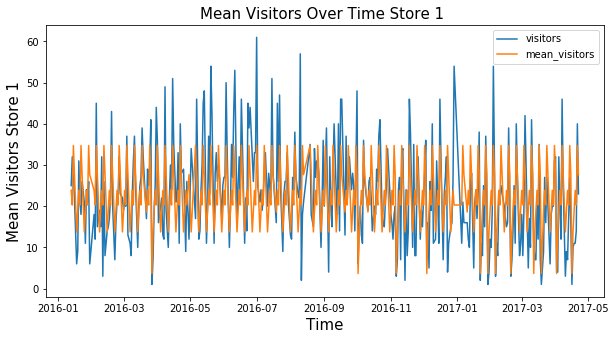

In [153]:
plt.figure(figsize=(10,5))
plt.plot(store01['visitors'])
plt.plot(store01['mean_visitors'])
plt.ylabel('Mean Visitors Store 1', fontsize=15)
plt.xlabel('Time', fontsize=15)
plt.title('Mean Visitors Over Time Store 1 ', fontsize=15)
plt.legend()